# Segment Every Grain

A SAM-based model for instance segmentation of images of grains

<a target="_blank" href="https://colab.research.google.com/github/zsylvester/segmenteverygrain/blob/main/notebooks/Segment_every_grain_colab.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

## Install and import packages

### Set up interactive figure backend in Colab

In [1]:
# this is needed to make figures in Colab interactive
!pip install ipympl
exit(0) # this restarts the runtime after installing ipympl -- otherwise you get an error when switching the matplotlib backend to ipympl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 515.8/515.8 kB 35.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 94.3 MB/s eta 0:00:00


In [1]:
from google.colab import output

output.enable_custom_widget_manager()

In [2]:
%matplotlib ipympl

### Install the other dependencies

In [ ]:
import torch
import torchvision

print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())
import sys

!{sys.executable} -m pip install opencv-python matplotlib
!{sys.executable} -m pip install sam2
!{sys.executable} -m pip install segmenteverygrain
!{sys.executable} -m pip install rtree
!wget https://dl.fbaipublicfiles.com/segment_anything_2/092424/sam2.1_hiera_large.pt

In [ ]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam_checkpoint = "sam2.1_hiera_large.pt"
device = "cuda"

sam = build_sam2("configs/sam2.1/sam2.1_hiera_l.yaml", sam_checkpoint, device=device)
predictor = SAM2ImagePredictor(sam)

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import measure
from keras.utils import load_img
from keras.saving import load_model
from importlib import reload
import segmenteverygrain as seg
import segmenteverygrain.interactions as si
from tqdm import trange, tqdm

## Download Unet model weights and create Unet model

In [8]:
!wget "https://raw.githubusercontent.com/zsylvester/segmenteverygrain/main/models/seg_model.keras"

--2026-01-18 11:19:48--  https://raw.githubusercontent.com/zsylvester/segmenteverygrain/main/models/seg_model.keras
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 26139262 (25M) [application/octet-stream]
Saving to: ‘seg_model.keras.1’

seg_model.keras.1   100%[===================>]  24.93M  --.-KB/s    in 0.04s   

2026-01-18 11:19:48 (600 MB/s) - ‘seg_model.keras.1’ saved [26139262/26139262]



In [9]:
# UNET model
unet = load_model(
    "seg_model.keras",
    custom_objects={"weighted_crossentropy": seg.weighted_crossentropy},
)

## Run segmentation

Grains are supposed to be well defined in the image; e.g., if a grain consists of only a few pxiels, it is unlikely to be detected.

The segmentation can take a few minutes even for medium-sized images, so do not start with large images (downsample them if necessary).

In [10]:
# get example image
!wget "https://raw.githubusercontent.com/zsylvester/segmenteverygrain/main/examples/barton_creek/barton_creek_image.jpg"

--2026-01-18 11:19:59--  https://raw.githubusercontent.com/zsylvester/segmenteverygrain/main/examples/barton_creek/barton_creek_image.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1451152 (1.4M) [image/jpeg]
Saving to: ‘barton_creek_image.jpg’

barton_creek_image. 100%[===================>]   1.38M  --.-KB/s    in 0.006s  

2026-01-18 11:20:00 (237 MB/s) - ‘barton_creek_image.jpg’ saved [1451152/1451152]



segmenting image tiles...


100%|██████████| 8/8 [00:05<00:00,  1.44it/s]


creating masks using SAM...


100%|██████████| 1118/1118 [01:34<00:00, 11.86it/s]


finding overlapping polygons...


1109it [00:18, 59.59it/s]


finding best polygons...


100%|██████████| 309/309 [00:19<00:00, 16.19it/s]


creating labeled image...


100%|██████████| 336/336 [00:03<00:00, 88.46it/s] 


CPU times: user 2min 38s, sys: 1.82 s, total: 2min 40s
Wall time: 2min 40s


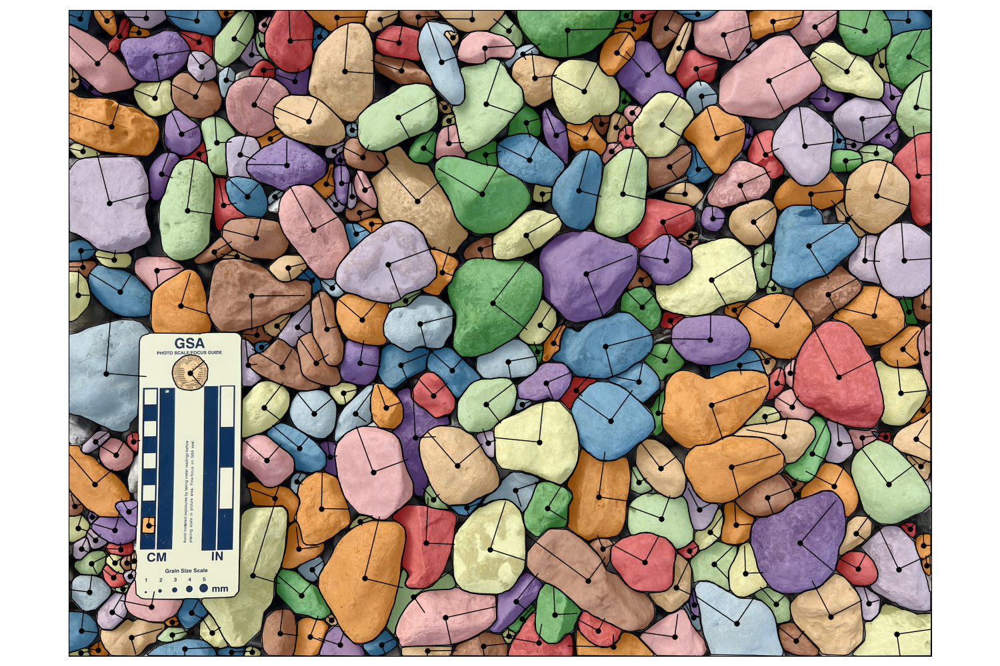

In [11]:
%%time
# replace this with the path to your image:
fname = "barton_creek_image.jpg"
image = np.array(load_img(fname))
image_pred = seg.predict_image(image, unet, I=256)

# decreasing the 'dbs_max_dist' parameter results in more SAM prompts
# (and longer processing times):
labels, coords = seg.label_grains(image, image_pred, dbs_max_dist=20.0)

# SAM segmentation, using the point prompts from the Unet:
all_grains, labels, mask_all, grain_data, fig, ax = seg.sam_segmentation(
    sam,
    image,
    image_pred,
    coords,
    labels,
    min_area=400.0,
    plot_image=True,
    remove_edge_grains=False,
    remove_large_objects=False,
)

## Interactive editing of segmentation results

**Note:** Interactive editing in Colab may be slower than in a local Jupyter notebook due to network latency.

Convert the polygons to Grain objects and use the interactive `GrainPlot` interface:

**Mouse controls:**
- **Left-click** on existing grain: Select/unselect
- **Left-click** in grain-free area: Instant grain creation
- **Alt + Left-click**: Multi-prompt grain creation
- **Alt + Right-click**: Background prompt for multi-prompt creation
- **Shift + drag**: Draw scale bar for unit conversion
- **Ctrl** (hold): Temporarily hide grain masks

**Keyboard controls:**
- **d**: Delete selected grains
- **m**: Merge selected grains
- **z**: Undo last created grain
- **Esc**: Clear selection and prompts

In [15]:
# Convert polygons to Grain objects
grains = si.polygons_to_grains(all_grains, image=image)
for g in tqdm(grains, desc='Measuring grains'):
    g.measure()

Measuring grains: 100%|██████████| 335/335 [00:00<00:00, 470.98it/s]


In [ ]:
# You only need to run this cell if you want to interactively edit the segmentation results and/or if you want to draw a scale bar
# If you want to draw a scale bar, you should change the 'scale_m' parameter before running this cell

# Set up SAM 2.1 predictor for adding new grains
predictor = SAM2ImagePredictor(sam)
predictor.set_image(image)

# Display interactive interface
plot = si.GrainPlot(
    grains,
    image = image,
    predictor = predictor,
    blit = False, # blitting does not work in Colab
    color_palette = 'tab20b',
    figsize = (12, 8),  # inches
    scale_m = 0.1,      # meters; change this before launching 'GrainPlot'
    color_by = None,
    px_per_m = 1856.6   # px/m; alternative to 'scale_m'; will be overwritten if scale bar is drawn on image, using 'scale_m'
)

plot.activate()

Run this cell when you are done with interactive editing to retrieve the updated grains and deactivate the interface:

In [17]:
# Retrieve updated grains and deactivate interactive mode
grains = plot.get_grains()
plot.deactivate()

## Get grain size distribution

If you drew a scale bar during interactive editing (Shift + drag), retrieve the scale. Otherwise, manually specify the scale:

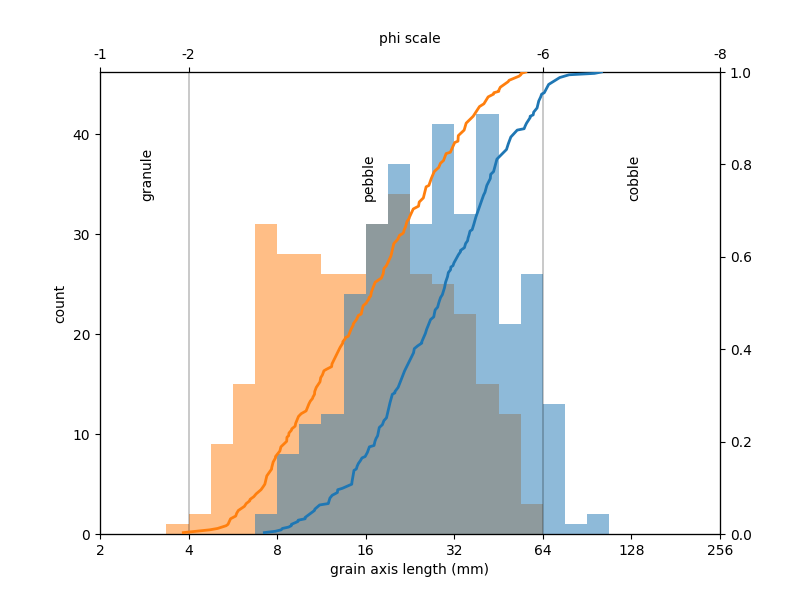

In [18]:
# Retrieve unit conversion factor if scale bar selected in image
px_per_m = plot.px_per_m

# hist = si.get_histogram(grains, px_per_m)
summary = si.get_summary(grains, px_per_m)
hist = seg.plot_histogram_of_axis_lengths(
    summary['major_axis_length']*1000,
    summary['minor_axis_length']*1000,
    binsize=0.25,
    # area=summary['area']
)

In [19]:
# Save results
out_fn = "barton_creek_image" # filename
# Grain shapes
si.save_grains(out_fn + '_grains.geojson', grains)
# Grain image
plot.savefig(out_fn + '_grains.jpg')
# Summary data
summary = si.save_summary(
    out_fn + '_summary.csv', grains, px_per_m=plot.px_per_m)
# Summary histogram
si.save_histogram(out_fn + '_summary.jpg', summary=summary)
# Training mask
si.save_mask(out_fn + '_mask.png', grains, image, scale=False)
si.save_mask(out_fn + '_mask2.jpg', grains, image, scale=True)
summary.head()

,area,centroid-0,centroid-1,perimeter,orientation,major_axis_length,minor_axis_length,max_intensity-0,min_intensity-0,mean_intensity-0,max_intensity-1,min_intensity-1,mean_intensity-1,max_intensity-2,min_intensity-2,mean_intensity-2
0,0.000170,43.247277,1309.320964,0.066573,1.539136,0.022892,0.011301,94.0,0.0,22.154817,97.0,0.0,23.111906,102.0,0.0,29.074043
1,0.000085,80.988571,445.739377,0.045964,0.232106,0.019567,0.006247,209.0,0.0,77.641716,210.0,0.0,78.874685,212.0,2.0,81.134567
2,0.000070,212.112536,1287.666581,0.038462,-0.261664,0.014378,0.007268,71.0,0.0,20.045216,71.0,0.0,20.790747,71.0,0.0,22.223975
3,0.000081,303.262090,1784.725820,0.045141,0.199630,0.015111,0.008094,191.0,2.0,117.826800,190.0,0.0,115.180492,188.0,5.0,112.630811
4,0.000060,314.153287,1820.273351,0.033627,1.375697,0.012050,0.006787,83.0,1.0,40.369830,79.0,0.0,39.457421,76.0,0.0,38.791971
